# Load HCP parcellated task data
## (version with Behavioural Data)

The HCP dataset comprises task-based fMRI from a large sample of human subjects. The NMA-curated dataset includes time series data that has been preprocessed and spatially-downsampled by aggregating within 360 regions of interest.

In order to use this dataset, please electronically sign the HCP data use terms at [ConnectomeDB](https://db.humanconnectome.org). Instructions for this are on pp. 24-25 of the [HCP Reference Manual](https://www.humanconnectome.org/storage/app/media/documentation/s1200/HCP_S1200_Release_Reference_Manual.pdf).

In this notebook, NMA provides code for downloading the data and doing some basic visualisation and processing.

In [1]:
# @title Install dependencies
!pip install nilearn --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 28.8 MB/s eta 0:00:00


In [2]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import torch

In [3]:
# Necessary for loading data and modeling in PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import math
import tensorflow as tf

In [4]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input,LSTM, Dense, LeakyReLU, ReLU
from tensorflow.keras.utils import plot_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [5]:
#@title Figure settings
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.style.use("https://raw.githubusercontent.com/NeuromatchAcademy/course-content/main/nma.mplstyle")

In [6]:
# The data shared for NMA projects is a subset of the full HCP dataset
N_SUBJECTS = 100

# The data have already been aggregated into ROIs from the Glasser parcellation
N_PARCELS = 360

# The acquisition parameters for all tasks were identical
TR = 0.72  # Time resolution, in seconds

# The parcels are matched across hemispheres with the same order
HEMIS = ["Right", "Left"]

# Each experiment was repeated twice in each subject
RUNS   = ['LR','RL']
N_RUNS = 2

# There are 7 tasks. Each has a number of 'conditions'
# TIP: look inside the data folders for more fine-graned conditions

EXPERIMENTS = {
    'MOTOR'      : {'cond':['lf','rf','lh','rh','t','cue']},
    'WM'         : {'cond':['0bbody','0bfaces','0bplaces','0btools','2bbody','2bfaces','2bplaces','2btools']},
    'EMOTION'    : {'cond':['fear','neut']},
    'GAMBLING'   : {'cond':['loss','win']},
    'LANGUAGE'   : {'cond':['math','story']},
    'RELATIONAL' : {'cond':['match','relation']},
    'SOCIAL'     : {'cond':['ment','rnd']}
}

> For a detailed description of the tasks have a look pages 45-54 of the [HCP reference manual](https://www.humanconnectome.org/storage/app/media/documentation/s1200/HCP_S1200_Release_Reference_Manual.pdf).

# Downloading data

The task data are shared in different files, but they will unpack into the same directory structure.


In [7]:
# @title Download data file
import os, requests

fname = "hcp_task.tgz"
url = "https://osf.io/2y3fw/download"

if not os.path.isfile(fname):
  try:
    r = requests.get(url)
  except requests.ConnectionError:
    print("!!! Failed to download data !!!")
  else:
    if r.status_code != requests.codes.ok:
      print("!!! Failed to download data !!!")
    else:
      with open(fname, "wb") as fid:
        fid.write(r.content)

In [8]:
# The download cells will store the data in nested directories starting here:
HCP_DIR = "./hcp_task"

# importing the "tarfile" module
import tarfile

# open file
with tarfile.open(fname) as tfile:
  # extracting file
  tfile.extractall('.')

subjects = np.loadtxt(os.path.join(HCP_DIR, 'subjects_list.txt'), dtype='str')

## Understanding the folder organisation

The data folder has the following organisation:

- hcp
  - regions.npy (information on the brain parcellation)
  - subjects_list.txt (list of subject IDs)
  - subjects (main data folder)
    - [subjectID] (subject-specific subfolder)
      - EXPERIMENT (one folder per experiment)
        - RUN (one folder per run)
          - data.npy (the parcellated time series data)
          - EVs (EVs folder)
            - [ev1.txt] (one file per condition)
            - [ev2.txt]
            - Stats.txt (behavioural data [where available] - averaged per run)
            - Sync.txt (ignore this file)



## Loading region information

Downloading this dataset will create the `regions.npy` file, which contains the region name and network assignment for each parcel.

Detailed information about the name used for each region is provided [in the Supplement](https://static-content.springer.com/esm/art%3A10.1038%2Fnature18933/MediaObjects/41586_2016_BFnature18933_MOESM330_ESM.pdf) to [Glasser et al. 2016](https://www.nature.com/articles/nature18933).

Information about the network parcellation is provided in [Ji et al, 2019](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6289683/).



In [9]:
regions = np.load(f"{HCP_DIR}/regions.npy").T
region_info = dict(
    name=regions[0].tolist(),
    network=regions[1],
    hemi=['Right']*int(N_PARCELS/2) + ['Left']*int(N_PARCELS/2),
)

# Help functions

We provide two helper functions: one for loading the time series from a single suject and a single run, and one for loading an EV file for each task.

An EV file (EV:Explanatory Variable) describes the task experiment in terms of stimulus onset, duration, and amplitude. These can be used to model the task time series data.

In [34]:
def load_single_timeseries(subject, experiment, run, remove_mean=True):
  """Load timeseries data for a single subject and single run.

  Args:
    subject (str):      subject ID to load
    experiment (str):   Name of experiment
    run (int):          (0 or 1)
    remove_mean (bool): If True, subtract the parcel-wise mean (typically the mean BOLD signal is not of interest)

  Returns
    ts (n_parcel x n_timepoint array): Array of BOLD data values

  """
  bold_run  = RUNS[run]
  bold_path = f"{HCP_DIR}/subjects/{subject}/{experiment}/tfMRI_{experiment}_{bold_run}"
  bold_file = "data.npy"
  ts = np.load(f"{bold_path}/{bold_file}")
  if remove_mean:
    ts -= ts.mean(axis=1, keepdims=True)
  return ts


def load_evs(subject, experiment, run):
  """Load EVs (explanatory variables) data for one task experiment.

  Args:
    subject (str): subject ID to load
    experiment (str) : Name of experiment
    run (int): 0 or 1

  Returns
    evs (list of lists): A list of frames associated with each condition

  """
  frames_list = []
  taskey = f'tfMRI_{experiment}_{RUNS[run]}'
  for cond in EXPERIMENTS[experiment]['cond']:
    ev_file  = f"{HCP_DIR}/subjects/{subject}/{experiment}/{taskey}/EVs/{cond}.txt"
    ev_array = np.loadtxt(ev_file, ndmin=2, unpack=True)
    ev       = dict(zip(["onset", "duration", "amplitude"], ev_array))
    # Determine when trial starts, rounded down
    start = np.floor(ev["onset"] / TR).astype(int)
    # Use trial duration to determine how many frames to include for trial
    duration = np.ceil(ev["duration"] / TR).astype(int)
    # Take the range of frames that correspond to this specific trial
    frames = [s + np.arange(0, d) for s, d in zip(start, duration)]
    frames_list.append(frames)

  return frames_list

# Example run

Let's load the timeseries data for the MOTOR experiment from a single subject and a single run

In [35]:
my_exp = 'LANGUAGE'
my_subj = subjects[1]
my_run = 1

data = load_single_timeseries(subject=my_subj,
                              experiment=my_exp,
                              run=my_run,
                              remove_mean=True)
print(data.shape)

(360, 316)


As you can see the time series data contains 284 time points in 360 regions of interest (ROIs).



Now in order to understand how to model these data, we need to relate the time series to the experimental manipulation. This is described by the EV files. Let us load the EVs for this experiment.

In [14]:
evs = load_evs(subject=my_subj, experiment=my_exp, run=my_run)

In [18]:
#HISTOGRAM OF ORIGINAL DATA FOR LANGUAGE TASK
def load_data3(my_exp , my_regions):
  HCP_data_frame = pd.read_csv('ddisc.csv')

  steps = int(10/TR+.5)    # calculating stpes for 10 seconds

  ts_list = []
  target_list = [] # wininf or loosing

  Gender_list = []

  order = torch.randperm(100).numpy()
  for i in order:     # subject
    for r in range(2):     # run

      data = load_single_timeseries(subject=subjects[i],
                                    experiment=my_exp,
                                    run=r,
                                    remove_mean=True)

      # Normalizing data by subject
      timeseries = (data - data.mean()) / data.std()

      # get the evs plus 10 seconds of the time series before and after (14 steps for tr=.76)
      evs = load_evs(subject=subjects[i], experiment=my_exp, run=r)

      for c in range(2):   # condition
        for t in range(len(evs[c])-1): # block
          evs_index = np.hstack(np.arange(evs[c][t][0],(evs[c][t][-1]+1)))
          ts_list.append(timeseries[my_regions,:][:,evs_index].T)
          target_list.append(c)
          Gender_list.append(1 if HCP_data_frame[HCP_data_frame['Subject_ID']==int(subjects[i])]['Gender'].item()=='F' else 0)

  tam = [arr.shape[0] for arr in ts_list]

  plt.hist([tam[i] for i in range(len(tam)) if target_list[i] == 0], bins=range(12, 42), alpha=0.5, label='math', color='blue')
  plt.hist([tam[i] for i in range(len(tam)) if target_list[i] == 1], bins=range(12, 42), alpha=0.5, label='story', color='green')
  plt.xticks(ticks =  np.arange(12, 42, step=2), labels=np.arange(12, 42, step=2))
# Añadir etiquetas y leyenda
  plt.xlabel('Tamaño del bloque')
  plt.ylabel('Frecuencia')
  plt.title('Histograma de Tam por Target')
  plt.legend(loc='upper right')

# Mostrar el histograma
  plt.show()

  return (
      np.array(ts_list),
      np.array(target_list),
      np.array(Gender_list)
  )

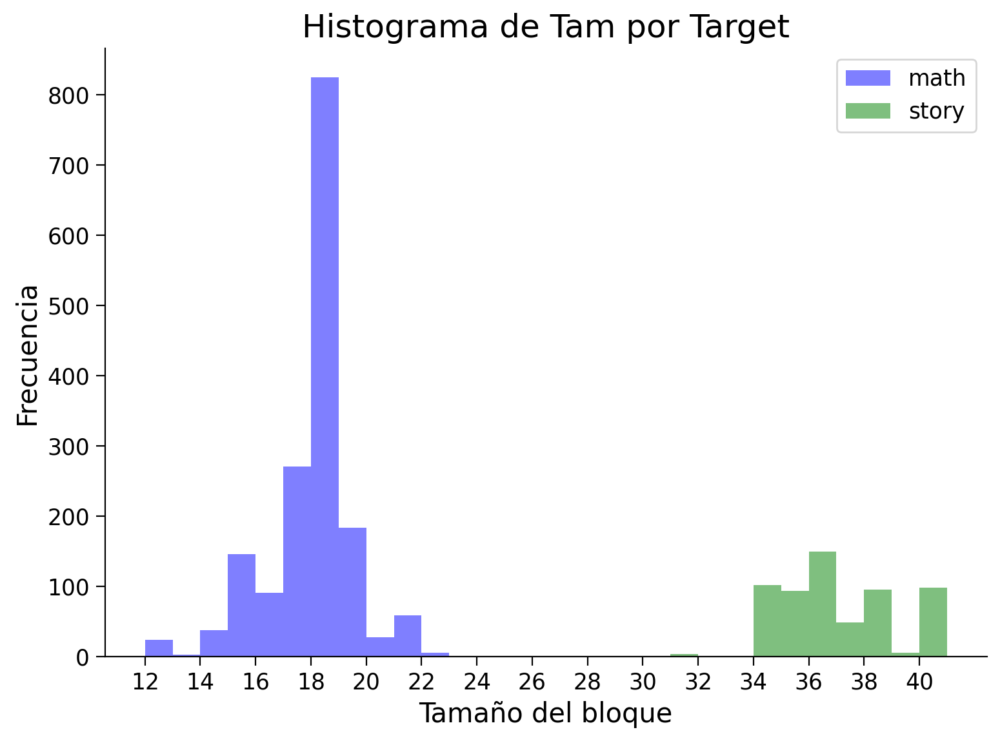

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (2275,) + inhomogeneous part.

In [19]:
experiment = 'LANGUAGE'
regions = [*range(360)]
label_type     = 'MS'
label = {}
X, label['MS'], label['gender'] = load_data3(experiment, regions)
y = label[label_type]

In [21]:
#HISTOGRAM OF LANGUAGE TASK, STORY BLOCKS ARE SPLITTED IN TWO BLOCKS SO THAT THEY MATCH THE MATH BLOCKS SIZE
def load_data2(my_exp , my_regions):

  HCP_data_frame = pd.read_csv('ddisc.csv')

  steps = int(10/TR+.5)    # calculating stpes for 10 seconds

  ts_list = []
  target_list = [] # wininf or loosing

  Gender_list = []

  order = torch.randperm(100).numpy()
  for i in order:     # subject
    for r in range(2):     # run

      data = load_single_timeseries(subject=subjects[i],
                                    experiment=my_exp,
                                    run=r,
                                    remove_mean=True)

      # Normalizing data by subject
      timeseries = (data - data.mean()) / data.std()

      # get the evs plus 10 seconds of the time series before and after (14 steps for tr=.76)
      evs = load_evs(subject=subjects[i], experiment=my_exp, run=r)

      for c in range(2):   # condition
        for t in range(len(evs[c])-1): # block
          if c==0: #Condición "MATH"

            evs_index = np.hstack(np.arange(evs[c][t][0],(evs[c][t][-1]+1)))
            ts_list.append(timeseries[my_regions,:][:,evs_index].T)
            target_list.append(c)
            Gender_list.append(1 if HCP_data_frame[HCP_data_frame['Subject_ID']==int(subjects[i])]['Gender'].item()=='F' else 0)
          else: #Condición "STORY"
            #Primer mitad
            evs_index = np.hstack(np.arange(evs[c][t][0], evs[c][t][0] + math.floor(len(evs[c][t])/2)))
            ts_list.append(timeseries[my_regions,:][:,evs_index].T)
            target_list.append(c)
            Gender_list.append(1 if HCP_data_frame[HCP_data_frame['Subject_ID']==int(subjects[i])]['Gender'].item()=='F' else 0)

            #Segunda mitad
            evs_index = np.hstack(np.arange(evs[c][t][0] + math.floor(len(evs[c][t])/2),evs[c][t][-1]+1))

            ts_list.append(timeseries[my_regions,:][:,evs_index].T)
            target_list.append(c)
            Gender_list.append(1 if HCP_data_frame[HCP_data_frame['Subject_ID']==int(subjects[i])]['Gender'].item()=='F' else 0)

  tam = [arr.shape[0] for arr in ts_list]

  plt.hist([tam[i] for i in range(len(tam)) if target_list[i] == 0], bins=range(12, 42), alpha=0.5, label='math', color='blue')
  plt.hist([tam[i] for i in range(len(tam)) if target_list[i] == 1], bins=range(12, 42), alpha=0.5, label='story', color='green')
  plt.xticks(ticks =  np.arange(12, 42, step=2), labels=np.arange(12, 42, step=2))
# Añadir etiquetas y leyenda
  plt.xlabel('Tamaño del bloque')
  plt.ylabel('Frecuencia')
  plt.title('Histograma de Tam por Target')
  plt.legend(loc='upper right')

# Mostrar el histograma
  plt.show()

  return(
      np.array(ts_list),
      np.array(target_list),
      np.array(Gender_list)
  )

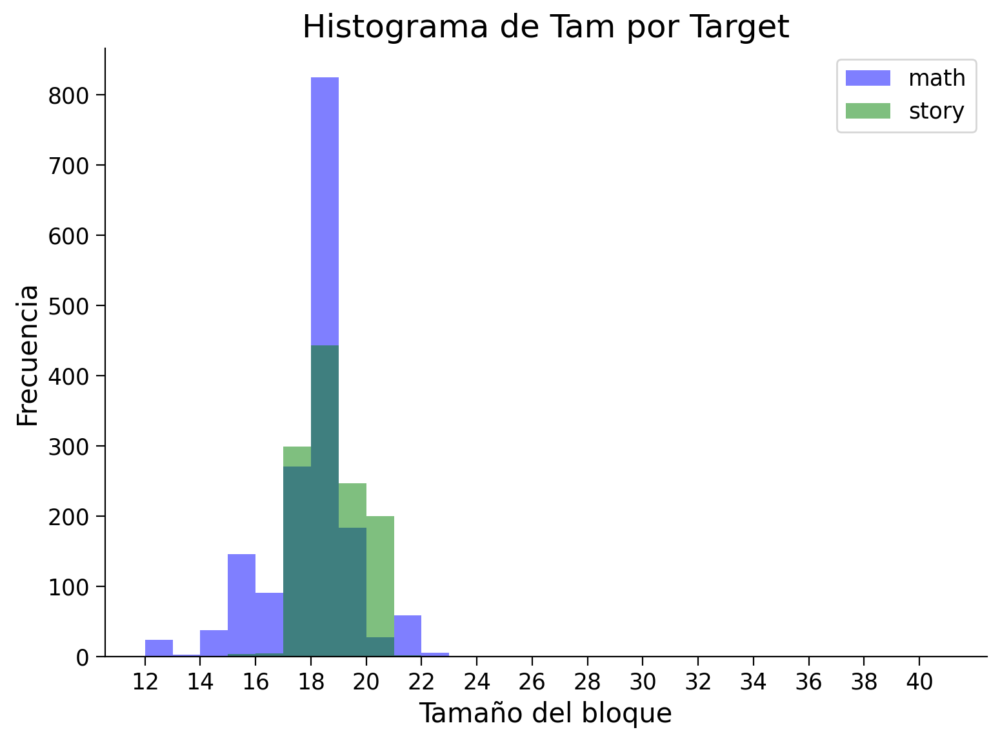

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (2875,) + inhomogeneous part.

In [23]:
experiment = 'LANGUAGE'
regions = [*range(360)]
label_type     = 'MS'
label = {}
X, label['MS'], label['gender'] = load_data2(experiment, regions)
y = label[label_type]

In [26]:
def load_data(my_exp , my_regions):

  HCP_data_frame = pd.read_csv('ddisc.csv')

  steps = int(10/TR+.5)    # calculating stpes for 10 seconds

  ts_list = []
  target_list = [] # wininf or loosing

  #DDisc_AUC_200_list = []
  #DDisc_AUC_40K_list = []
  Flanker_Unadj_list = []
  Gender_list = []

  order = torch.randperm(100).numpy()
  for i in order:     # subject
    for r in range(2):     # run

      data = load_single_timeseries(subject=subjects[i],
                                    experiment=my_exp,
                                    run=r,
                                    remove_mean=True)

      # Normalizing data by subject
      timeseries = (data - data.mean()) / data.std()

      # get the evs plus 10 seconds of the time series before and after (14 steps for tr=.76)
      evs = load_evs(subject=subjects[i], experiment=my_exp, run=r)

      for c in range(2):   # condition
        for t in range(len(evs[c])-1): # block
          if c==0: #Condición "MATH"

            evs_index = np.hstack(np.arange(evs[c][t][0],(evs[c][t][-1]+1)))
            if len(evs_index) == 18:
              ts_list.append(timeseries[my_regions,:][:,evs_index].T)
              target_list.append(c)
              Gender_list.append(1 if HCP_data_frame[HCP_data_frame['Subject_ID']==int(subjects[i])]['Gender'].item()=='F' else 0)
          else: #Condición "STORY"
            #Primer mitad
            evs_index = np.hstack(np.arange(evs[c][t][0], evs[c][t][0] + math.floor(len(evs[c][t])/2)))
            if len(evs_index) == 18:
              ts_list.append(timeseries[my_regions,:][:,evs_index].T)
              target_list.append(c)
              Gender_list.append(1 if HCP_data_frame[HCP_data_frame['Subject_ID']==int(subjects[i])]['Gender'].item()=='F' else 0)

            #Segunda mitad
            evs_index = np.hstack(np.arange(evs[c][t][0] + math.floor(len(evs[c][t])/2),evs[c][t][-1]+1))

            if len(evs_index) == 18:
              ts_list.append(timeseries[my_regions,:][:,evs_index].T)
              target_list.append(c)
              Gender_list.append(1 if HCP_data_frame[HCP_data_frame['Subject_ID']==int(subjects[i])]['Gender'].item()=='F' else 0)

  return (
      np.array(ts_list),
      np.array(target_list),
      np.array(Gender_list)
  )

In [27]:
experiment = 'LANGUAGE'
regions = [*range(360)]
label_type  = 'MS'
label = {}
#X, label['MS'], label['gender'] = load_data(experiment, regions)
#y = label[label_type]
ts_list, target_list, Gender_list = load_data(experiment, regions)



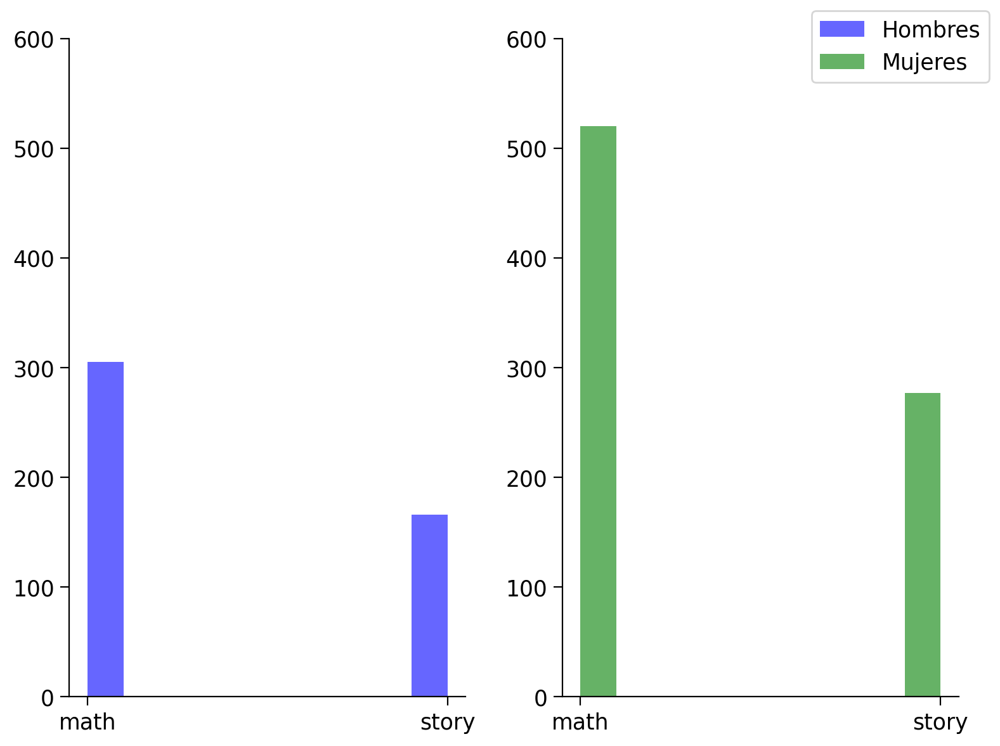

In [28]:
tam = [arr.shape[0] for arr in ts_list]
#print(max(len(arr) for arr in ts_list))
#print(min(len(arr) for arr in ts_list))

df = pd.DataFrame({"Gender": Gender_list,
                   "Task": target_list
})


fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.hist(df[df["Gender"]==0]["Task"].reset_index(drop=True), alpha=0.6,color = 'blue', label = "Hombres", histtype = 'bar')
ax1.set_ylim(0,600)
ax1.set_xticks(ticks =  [0,1], labels=["math","story"])
ax2.hist(df[df["Gender"]==1]["Task"].reset_index(drop=True), alpha=0.6, color = 'green', label = "Mujeres", histtype = 'bar')
ax2.set_ylim(0,600)
ax2.set_xticks(ticks =  [0,1], labels=["math","story"])
fig.legend(loc='upper right')

# Mostrar el histograma
plt.show()

In [29]:
cont_math = 0
cont_story = 0
cont_h_math = 0
cont_m_math = 0
cont_h_story = 0
cont_m_story = 0

for i in range(len(tam)):
  if target_list[i] == 0:
    cont_math = cont_math + 1
    if Gender_list[i] == 0:
      cont_h_math = cont_h_math + 1
    else:
      cont_m_math = cont_m_math + 1
  else:
    cont_story = cont_story + 1
    if Gender_list[i] == 0:
      cont_h_story = cont_h_story + 1
    else:
      cont_m_story = cont_m_story + 1

print(cont_math)
print(cont_h_math)
print(cont_m_math)

print(cont_story)
print(cont_h_story)
print(cont_m_story)

825
305
520
443
166
277


In [30]:
# AUX funtion to build time-series dataset
def delayed_dataset(X, Y, delay, hist_size):
  '''
  Params
    X: data matrix [n_time_steps, n_X_feats]
    Y: label matrix [n_time_steps, n_Y_feats]
    delay: integer indicating the delay between last time step in x and time step in y
    hist_size: integer indicating the number of time steps in each sample of x
  Returns
    x: tensor of input data [n_samples, n_timesteps, n_X_features]
    y: tensor of output data [n_samples, n_Y_features]
  '''
  n_samples = Y.shape[0] - (delay + hist_size)
  x = np.zeros((n_samples, hist_size, X.shape[1]))
  y = np.zeros((n_samples, Y.shape[1]))

  for ind in range(n_samples):
    x[ind] = X[ind : ind + hist_size]
    y[ind] = Y[ind + hist_size + delay]
  return x, y



In [31]:
X_train, X_test, Y_train, Y_test = train_test_split(ts_list, target_list, test_size=0.10)

print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)


(1141, 18, 360)
(127, 18, 360)
(1141,)
(127,)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


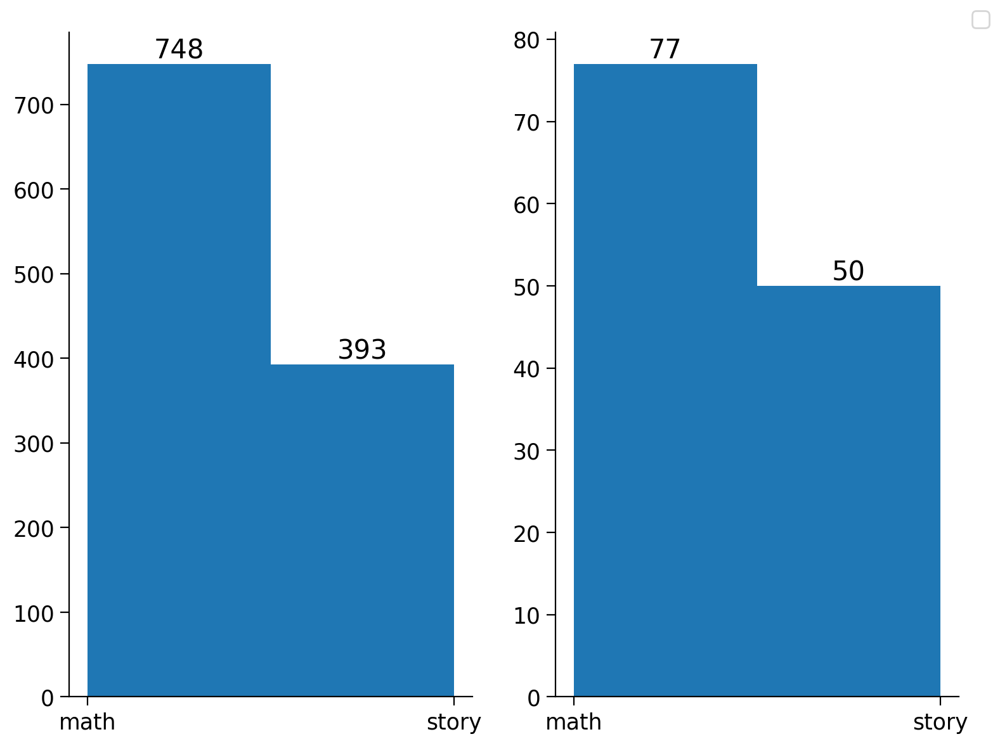

In [32]:
#df_t = pd.DataFrame({"Task_Train": Y_train,
#                   "Task_Test": Y_test
#})


fig, (ax1, ax2) = plt.subplots(1, 2)

_, _, bars = ax1.hist(Y_train, histtype = 'bar', bins = 2)
ax1.set_xticks(ticks =  [0,1], labels=["math","story"])
ax1.bar_label(bars)
#ax1.set_ylim(0,900)
_, _, bars_2 = ax2.hist(Y_test, histtype = 'bar', bins = 2)
#ax2.set_ylim(0,600)
ax2.bar_label(bars_2)
ax2.set_xticks(ticks =  [0,1], labels=["math","story"])
fig.legend(loc='upper right')

# Mostrar el histograma
plt.show()

In [33]:
rnn_model = Sequential()
rnn_model.add(Input(shape=(X_train.shape[1], X_train.shape[2])))
rnn_model.add(LSTM(units=32))
rnn_model.add(Dense(16))
rnn_model.add(LeakyReLU())
rnn_model.add(Dense(1))

rnn_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 32)                50304     
                                                                 
 dense (Dense)               (None, 16)                528       
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 16)                0         
                                                                 
 dense_1 (Dense)             (None, 1)                 17        
                                                                 
Total params: 50849 (198.63 KB)
Trainable params: 50849 (198.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [26]:
rnn_model.compile(loss='mean_squared_error', optimizer='rmsprop')

In [27]:
history = rnn_model.fit(X_train, Y_train, epochs=30, batch_size=4, validation_split=0.1)

Epoch 1/30
257/257 [==============================] - 8s 19ms/step - loss: 0.0911 - val_loss: 0.0321
Epoch 2/30
257/257 [==============================] - 3s 11ms/step - loss: 0.0173 - val_loss: 0.0207
Epoch 3/30
257/257 [==============================] - 3s 11ms/step - loss: 0.0084 - val_loss: 0.0172
Epoch 4/30
257/257 [==============================] - 3s 11ms/step - loss: 0.0064 - val_loss: 0.0242
Epoch 5/30
257/257 [==============================] - 4s 15ms/step - loss: 0.0043 - val_loss: 0.0169
Epoch 6/30
257/257 [==============================] - 3s 13ms/step - loss: 0.0032 - val_loss: 0.0104
Epoch 7/30
257/257 [==============================] - 3s 12ms/step - loss: 0.0020 - val_loss: 0.0099
Epoch 8/30
257/257 [==============================] - 3s 11ms/step - loss: 0.0019 - val_loss: 0.0101
Epoch 9/30
257/257 [==============================] - 3s 12ms/step - loss: 0.0016 - val_loss: 0.0094
Epoch 10/30
257/257 [==============================] - 6s 25ms/step - loss: 0.0011 - val_lo

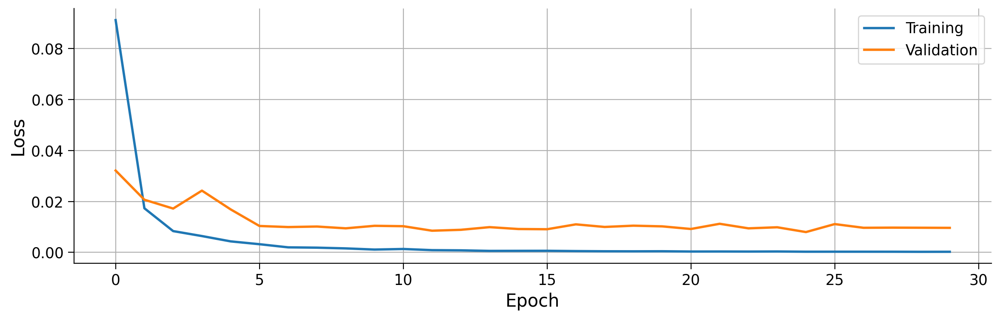

In [28]:
# Plot loss
plt.figure(figsize=(12, 4))
plt.plot(history.history['loss'], label='Training', linewidth=2)
plt.plot(history.history['val_loss'], label='Validation', linewidth=2)
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.show()

In [29]:
# Predict on training and test sets
Y_train_hat = np.round(rnn_model.predict(X_train))
Y_test_hat = np.round(rnn_model.predict(X_test))


4/4 [==============================] - 0s 7ms/step


(1141, 1)
(127, 1)
(127, 18, 360)
(1141,)
[1 1 0 ... 0 0 1]
Matriz de confusión Train
Matriz de confusión Test


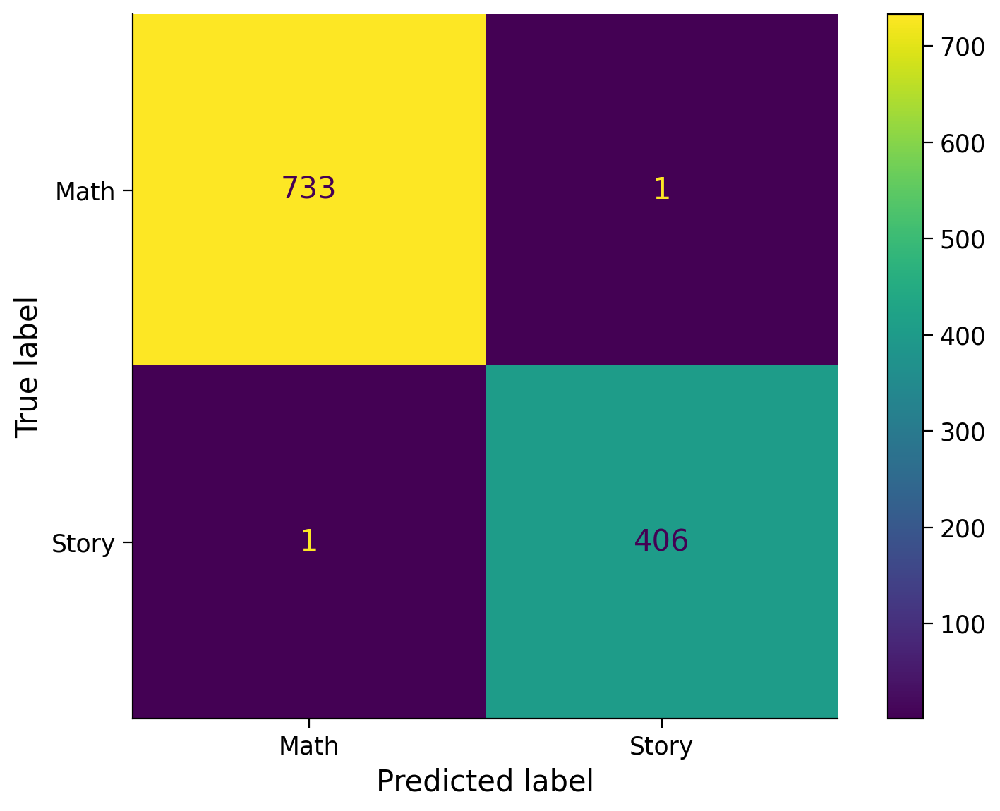

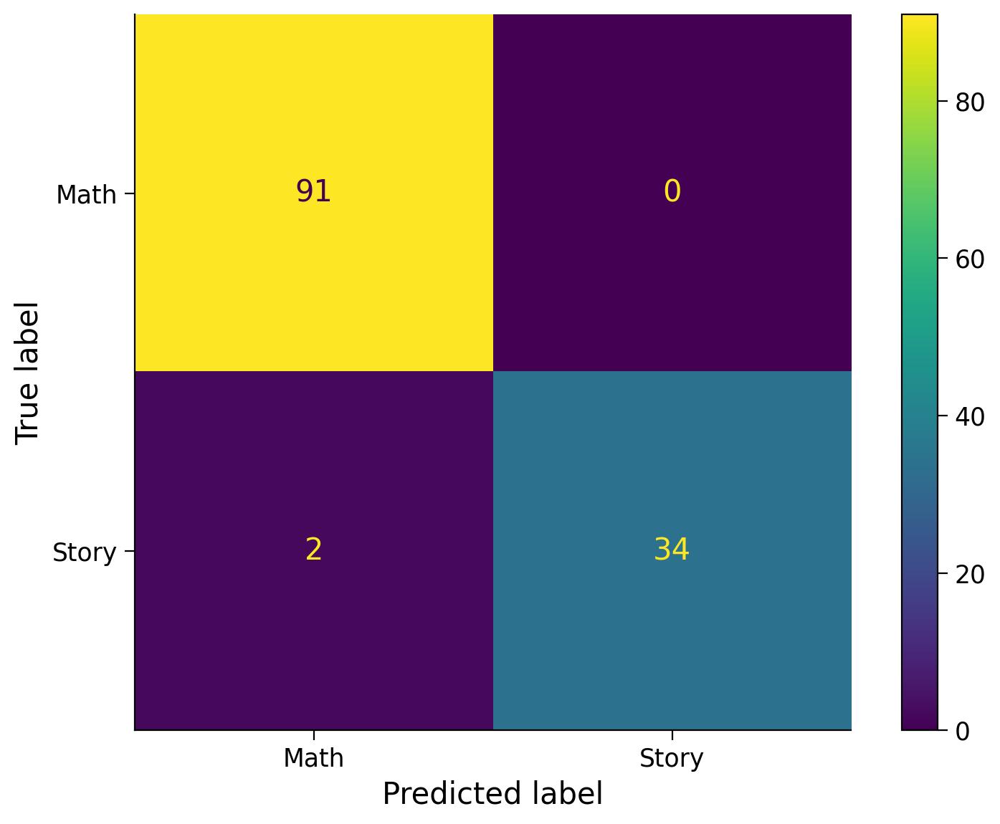

In [30]:
print(Y_train_hat.shape)
print(Y_test_hat.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_train[:])
#print(np.round(Y_test_hat))

print("Matriz de confusión Train")
cm_train = confusion_matrix(Y_train, Y_train_hat)

disp_train = ConfusionMatrixDisplay(confusion_matrix=cm_train,
                       display_labels=['Math', 'Story'])

disp_train.plot()

print("Matriz de confusión Test")
cm_test = confusion_matrix(Y_test, Y_test_hat)
disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test,
                       display_labels=['Math', 'Story'])

disp_test.plot()

plt.show()

In [31]:
def get_gradient(model, inputs):
    inputs = tf.convert_to_tensor(inputs, dtype=tf.float32)
    inputs = tf.expand_dims(inputs, axis=0)
    with tf.GradientTape() as tape:
        tape.watch(inputs)
        predictions = model(inputs)
    gradient = tape.gradient(predictions, inputs)
    return gradient.numpy()


# Calcular el gradiente para una muestra de datos
gradient_math = get_gradient(rnn_model, torch.tensor(X_test[1]))
gradient_story = get_gradient(rnn_model, torch.tensor(X_test[0]))
for x in range(2,len(X_test.shape)):
  if Y_test[x] == 0:
    gradient_math = gradient_math + get_gradient(rnn_model, torch.tensor(X_test[x]))
  else:
    gradient_story = gradient_story + get_gradient(rnn_model, torch.tensor(X_test[x]))

gradiente_math =  gradient_math
gradiente_story =  gradient_story

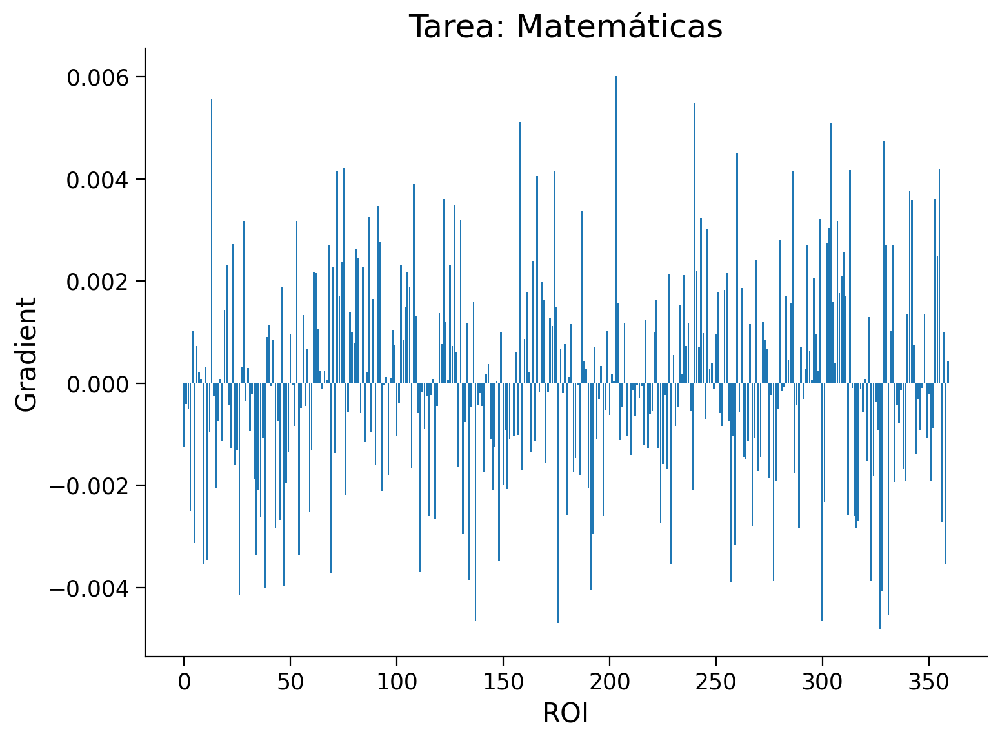

In [32]:

# Visualizar la importancia de las características

gradient_sum_math = np.sum(gradiente_math, axis=(0, 1))

plt.bar(range(len(gradient_sum_math)), gradient_sum_math)
plt.xlabel('ROI')
plt.ylabel('Gradient')
plt.title("Tarea: Matemáticas")
plt.show()

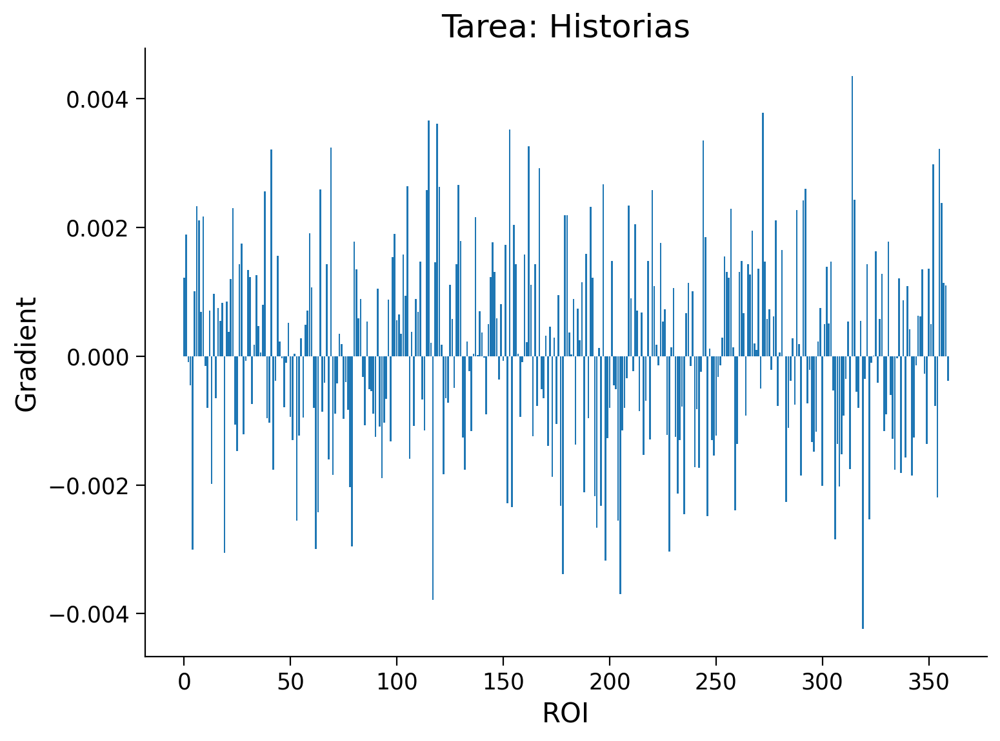

In [33]:
gradient_sum_story = np.sum(gradiente_story, axis=(0, 1))

plt.bar(range(len(gradient_sum_story)), gradient_sum_story)
plt.xlabel('ROI')
plt.ylabel('Gradient')
plt.title("Tarea: Historias")
plt.show()

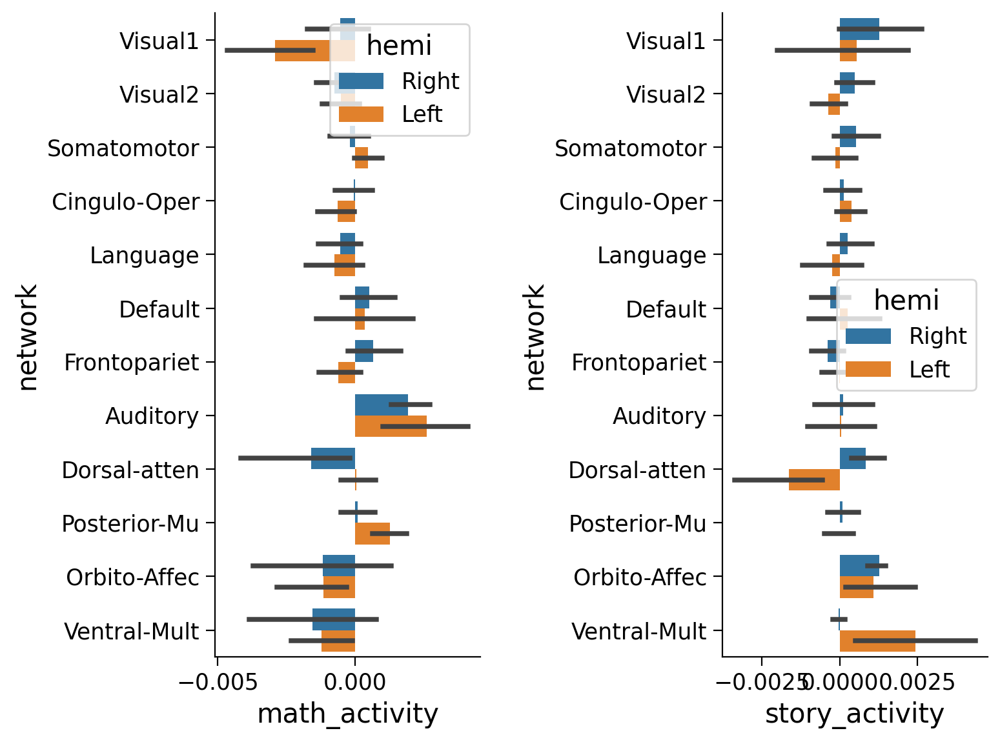

In [34]:
df = pd.DataFrame({'math_activity' : gradient_sum_math,
                   'story_activity' : gradient_sum_story,
                   'network' : region_info['network'],
                   'hemi' : region_info['hemi']})

fig, (ax1, ax2) = plt.subplots(1, 2)
sns.barplot(y='network', x='math_activity', data=df, hue='hemi',ax=ax1)
sns.barplot(y='network', x='story_activity', data=df, hue='hemi',ax=ax2)
plt.show()

In [35]:
def average_frames(data, evs, experiment, cond):
  idx = EXPERIMENTS[experiment]['cond'].index(cond)
  return np.mean(np.concatenate([np.mean(data[:, evs[idx][i]], axis=1, keepdims=True) for i in range(len(evs[idx])-1) ], axis=-1), axis=1)

math_activity = average_frames(data, evs, my_exp, 'math')
story_activity = average_frames(data, evs, my_exp, 'story')

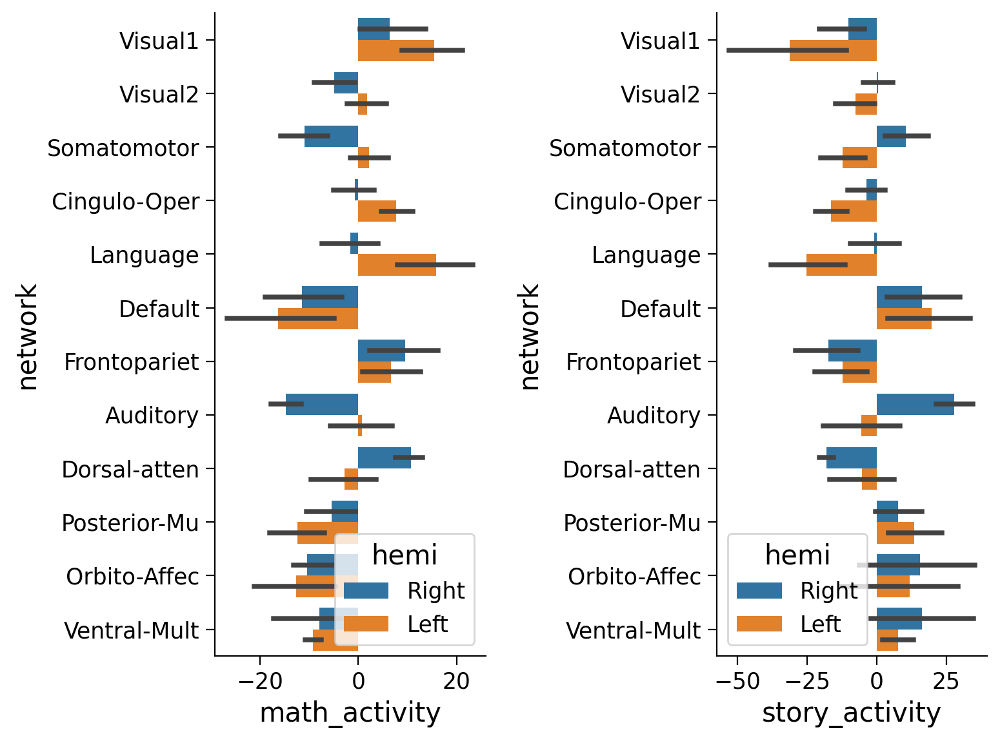

In [36]:
df_general = pd.DataFrame({'math_activity' : math_activity,
                   'story_activity' : story_activity,
                   'network' : region_info['network'],
                   'hemi' : region_info['hemi']})



fig, (ax1, ax2) = plt.subplots(1, 2)
sns.barplot(y='network', x='math_activity', data=df_general, hue='hemi',ax=ax1)
sns.barplot(y='network', x='story_activity', data=df_general, hue='hemi',ax=ax2)
plt.show()

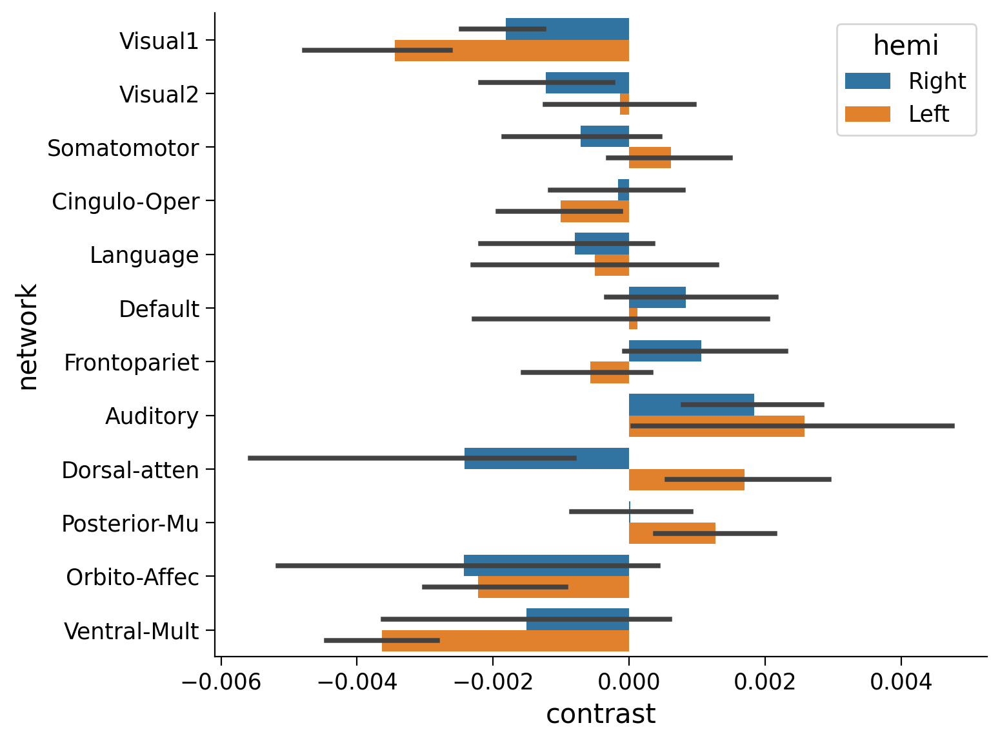

In [37]:
contraste_grad = gradient_sum_math - gradient_sum_story

df_contraste_grad = pd.DataFrame({'contrast' : contraste_grad,
                   'network' : region_info['network'],
                   'hemi' : region_info['hemi']})



plt.figure()
sns.barplot(y='network', x='contrast', data=df_contraste_grad, hue='hemi')
plt.show()

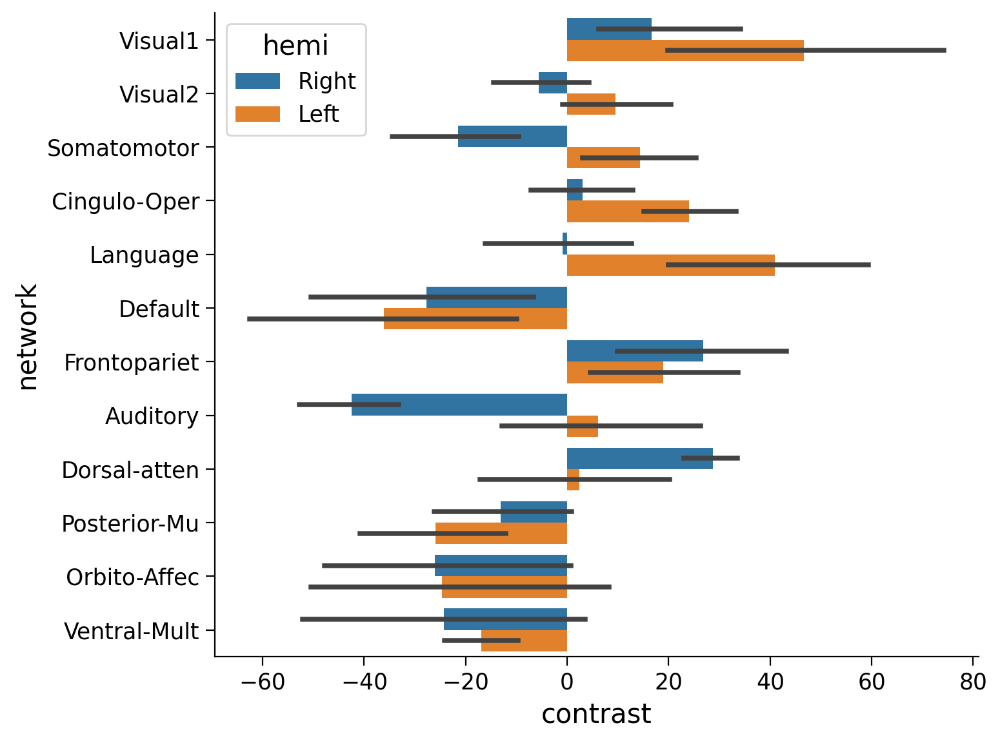

In [38]:
contraste = math_activity - story_activity

df_contraste = pd.DataFrame({'contrast' : contraste,
                   'network' : region_info['network'],
                   'hemi' : region_info['hemi']})



plt.figure()
sns.barplot(y='network', x='contrast', data=df_contraste, hue='hemi')
plt.show()

In [44]:
# @title NMA provides an atlas. Run this cell to download it
import os, requests

# NMA provides an atlas
fname = f"{HCP_DIR}/atlas.npz"
url = "https://osf.io/j5kuc/download"

if not os.path.isfile(fname):
  try:
    r = requests.get(url)
  except requests.ConnectionError:
    print("!!! Failed to download data !!!")
  else:
    if r.status_code != requests.codes.ok:
      print("!!! Failed to download data !!!")
    else:
      with open(fname, "wb") as fid:
        fid.write(r.content)

with np.load(fname) as dobj:
  atlas = dict(**dobj)

In [46]:
# This uses the nilearn package
from nilearn import plotting, datasets

# Try both hemispheres (L->R and left->right)
fsaverage = datasets.fetch_surf_fsaverage()
surf_contrast = 1500*contraste_grad[atlas["labels_L"]]
plotting.view_surf(fsaverage['infl_left'],
                   surf_contrast,
                   vmax=20)

In [47]:
# This uses the nilearn package
from nilearn import plotting, datasets

# Try both hemispheres (L->R and left->right)
fsaverage = datasets.fetch_surf_fsaverage()
surf_contrast = 1500*contraste_grad[atlas["labels_R"]]
plotting.view_surf(fsaverage['infl_right'],
                   surf_contrast,
                   vmax=20)

In [42]:
# This uses the nilearn package
from nilearn import plotting, datasets

# Try both hemispheres (L->R and left->right)
fsaverage = datasets.fetch_surf_fsaverage()
surf_contrast = gradient_sum_math[atlas["labels_L"]]
plotting.view_surf(fsaverage['infl_left'],
                   surf_contrast,
                   vmax=0.004)

In [43]:
# This uses the nilearn package
from nilearn import plotting, datasets

# Try both hemispheres (L->R and left->right)
fsaverage = datasets.fetch_surf_fsaverage()
surf_contrast = gradient_sum_math[atlas["labels_R"]]
plotting.view_surf(fsaverage['infl_right'],
                   surf_contrast,
                   vmax=0.004)